# Nemotron Personas USA - Comprehensive Data Analysis

## Executive Summary
This notebook presents a professional analysis of the NVIDIA Nemotron-Personas-USA dataset, revealing key patterns, correlations, and actionable insights for strategic decision-making.

**Analysis Date:** February 27, 2026  
**Dataset Source:** [Hugging Face - nvidia/Nemotron-Personas-USA](https://huggingface.co/datasets/nvidia/Nemotron-Personas-USA)  
**Analyst:** LucyDev256

---

## Table of Contents
1. [Dataset Loading & Initial Exploration](#1)
2. [Statistical Overview & Data Quality](#2)
3. [Text Analysis & Feature Extraction](#3)
4. [Clustering & Segmentation](#4)
5. [Correlation & Pattern Discovery](#5)
6. [Advanced Modeling & Insights](#6)
7. [Executive Dashboard & Visualizations](#7)
8. [Key Findings & Recommendations](#8)

---
## 1. Import Required Libraries <a id="1"></a>

Setting up the analytical environment with all necessary libraries for data manipulation, text processing, machine learning, and visualization.

In [1]:
# Core Data Libraries
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import os

# Load environment variables for secure token storage
try:
    from dotenv import load_dotenv
    load_dotenv()
    print("✓ Environment variables loaded")
except ImportError:
    print("⚠ python-dotenv not installed. Run: pip install python-dotenv")

# Data Loading
from datasets import load_dataset

# Text Processing
import re
from collections import Counter
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from wordcloud import WordCloud

# Machine Learning & Clustering
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA, LatentDirichletAllocation
from sklearn.manifold import TSNE
import umap
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.stats import chi2_contingency, pearsonr, spearmanr

# Modeling
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, r2_score

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 100)
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Download NLTK resources
try:
    nltk.download('stopwords', quiet=True)
    nltk.download('punkt', quiet=True)
    nltk.download('averaged_perceptron_tagger', quiet=True)
except:
    pass

print("✓ All libraries imported successfully")
print(f"Pandas version: {pd.__version__}")
print(f"NumPy version: {np.__version__}")

✓ Environment variables loaded
✓ All libraries imported successfully
Pandas version: 2.3.3
NumPy version: 2.4.2


---
## 2. Dataset Loading & Initial Exploration <a id="2"></a>

Loading the Nemotron-Personas-USA dataset from Hugging Face and performing initial exploration to understand the data structure, schema, and content.

In [2]:
# Load dataset from Hugging Face with authentication
print("Loading Nemotron-Personas-USA dataset from Hugging Face...")

# Get HuggingFace token from environment variable (secure method)
hf_token = os.getenv('HUGGINGFACE_TOKEN')

if hf_token:
    print("✓ Using authenticated access (token found)")
    dataset = load_dataset("nvidia/Nemotron-Personas-USA", token=hf_token)
else:
    print("⚠ No token found - using public access")
    print("  (Add HUGGINGFACE_TOKEN to .env file for authenticated access)")
    dataset = load_dataset("nvidia/Nemotron-Personas-USA")

# Convert to pandas DataFrame
df = pd.DataFrame(dataset['train'])

print(f"\n✓ Dataset loaded successfully!")
print(f"Total records: {len(df):,}")
print(f"Total features: {len(df.columns)}")
print(f"Memory usage: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

Loading Nemotron-Personas-USA dataset from Hugging Face...
✓ Using authenticated access (token found)

✓ Dataset loaded successfully!
Total records: 1,000,000
Total features: 23
Memory usage: 9760.93 MB


In [3]:
# Display first few rows
print("Sample Data Preview:")
print("="*100)
df.head()

Sample Data Preview:


,uuid,professional_persona,sports_persona,arts_persona,travel_persona,culinary_persona,persona,cultural_background,skills_and_expertise,skills_and_expertise_list,hobbies_and_interests,hobbies_and_interests_list,career_goals_and_ambitions,sex,age,marital_status,education_level,bachelors_field,occupation,city,state,zipcode,country
0,e7c0574639a244c8972c92aab9501035,"Mary Alberti is a front‑line food service specialist whose razor‑sharp cash handling, inventory ...",Mary Alberti fuels their fitness routine by clocking 3‑5 mile runs around Lake Mendota with the ...,"Mary Alberti finds creative inspiration in the lyrical storytelling of John Prine, the atmospher...",Mary Alberti prefers meticulously planned weekend getaways that blend quiet lakeside relaxation ...,Mary Alberti showcases an intermediate culinary talent by perfecting Midwestern classics such as...,"Mary Alberti is a routine‑obsessed, bullet‑journal aficionado who balances disciplined work ambi...","Mary is a second‑generation Italian‑American raised in Madison, Wisconsin. Her family’s modest, ...","Mary has become highly proficient in front‑line food service operations, including precise cash ...","['POS system operation', 'Cash handling', 'Food safety compliance', 'Inventory management', 'Tea...",In her free time Mary enjoys activities that blend routine with personal improvement. She practi...,"['Bullet journaling', 'Home cooking and baking', 'Raised-bed gardening', 'Running around Lake Me...","She aims to advance from crew member to shift supervisor within the next year, then to restauran...",Female,28,never_married,high_school,,fast_food_or_counter_worker,Madison,WI,53717,USA
1,50f90a6f17de473f9ca15f00afdedf7a,"Alicia Gonzalez, a research scientist specializing in machine learning and natural language proc...","Alicia Gonzalez, an enthusiastic hiker who spends weekends trekking the Butte County trails with...","Alicia Gonzalez, an abstract painter and generative digital artist, draws creative fuel from the...","Alicia Gonzalez, who mixes meticulous research with spontaneous curiosity, favors rugged adventu...","Alicia Gonzalez, an intermediate‑to‑advanced home cook, relishes preparing bandeja paisa, arepas...","Alicia Gonzalez fuses scientific precision with artistic chaos, chasing novelty in code and canv...","Alicia was raised in a bilingual Colombian household, with parents who immigrated to the United ...",Alicia is a computer and information research scientist who combines rigorous STEM training with...,"['Machine Learning', 'Deep Learning', 'Natural Language Processing', 'Data Mining', 'Statistical...","Alicia channels her love of novelty and abstraction into abstract painting, generative digital a...","['Abstract Painting', 'Generative Digital Art', 'Speculative Fiction Reading', 'Hiking', 'Cookin...",Alicia aims to lead an interdisciplinary research team that pushes the boundaries of AI for crea...,Female,29,divorced,bachelors,stem,computer_or_information_research_scientist,Chico,CA,95928,USA
2,f2f5dbaf4d3d43f68adeb7f318afa3a2,"Deeva Cintron, an 85‑year‑old community finance volunteer and event coordinator, leverages her m...","Deeva Cintron, a devoted fan of the Detroit Tigers and the Michigan Wolverines women's basketbal...","Deeva Cintron, an avid quilt maker and historical‑fiction reader, draws inspiration from the pai...","Deeva Cintron, who prefers meticulously planned road trips, has visited Mackinac Island, the Upp...","Deeva Cintron, who delights in homestyle cooking, prepares chicken pot pie with garden‑grown car...","Deeva Cintron, an 85‑year‑old garden‑loving quilt‑artisan and budget‑guru, balances a quiet comp...",Deeva was raised in a mid‑western white family in Michigan. Her parents were second‑generation d...,Deeva has strong organizational and administrative abilities built over decades of managing a ho...,"['budgeting', 'record keeping', 'schedule management', 'basic accounting', 'computer basics', 'g...",Deeva enjoys solitary and low‑ke

In [4]:
# Dataset schema and data types
print("Dataset Schema:")
print("="*100)
schema_df = pd.DataFrame({
    'Column': df.columns,
    'Data Type': df.dtypes.values,
    'Non-Null Count': df.count().values,
    'Null Count': df.isnull().sum().values,
    'Null %': (df.isnull().sum() / len(df) * 100).round(2).values,
    'Unique Values': [df[col].nunique() for col in df.columns]
})
schema_df

Dataset Schema:


,Column,Data Type,Non-Null Count,Null Count,Null %,Unique Values
0,uuid,object,1000000,0,0.0,1000000
1,professional_persona,object,1000000,0,0.0,1000000
2,sports_persona,object,1000000,0,0.0,1000000
3,arts_persona,object,1000000,0,0.0,1000000
4,travel_persona,object,1000000,0,0.0,1000000
5,culinary_persona,object,1000000,0,0.0,1000000
6,persona,object,1000000,0,0.0,1000000
7,cultural_background,object,1000000,0,0.0,1000000
8,skills_and_expertise,object,1000000,0,0.0,1000000
9,skills_and_expertise_list,object,1000000,0,0.0,999981


In [5]:
# Identify column types
string_cols = df.select_dtypes(include=['object']).columns.tolist()
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

print(f"\n📊 Column Type Distribution:")
print(f"   • String/Object columns: {len(string_cols)}")
print(f"   • Numeric columns: {len(numeric_cols)}")

# Identify and filter out UUID columns for text analysis
uuid_cols = [col for col in string_cols if 'uuid' in col.lower()]
if uuid_cols:
    print(f"\n⚠️  UUID columns detected (will be excluded from text analysis):")
    for col in uuid_cols:
        print(f"   • {col}")

print(f"\n📝 String Columns (Primary Focus):")
for col in string_cols[:10]:  # Show first 10
    print(f"   • {col}")
if len(string_cols) > 10:
    print(f"   ... and {len(string_cols) - 10} more")


📊 Column Type Distribution:
   • String/Object columns: 22
   • Numeric columns: 1

⚠️  UUID columns detected (will be excluded from text analysis):
   • uuid

📝 String Columns (Primary Focus):
   • uuid
   • professional_persona
   • sports_persona
   • arts_persona
   • travel_persona
   • culinary_persona
   • persona
   • cultural_background
   • skills_and_expertise
   • skills_and_expertise_list
   ... and 12 more


---
## 3. Dataset Statistics & Data Quality Assessment <a id="2"></a>

Comprehensive statistical analysis to understand data distribution, quality, and characteristics.

In [6]:
# Comprehensive Statistics Summary
print("📊 DATASET STATISTICS SUMMARY")
print("="*100)

# Basic statistics
stats_summary = {
    'Metric': [
        'Total Records',
        'Total Features',
        'Memory Usage (MB)',
        'Duplicate Rows',
        'Completely Empty Rows',
        'String Columns',
        'Numeric Columns',
        'Total Missing Values',
        'Missing Value %'
    ],
    'Value': [
        f"{len(df):,}",
        len(df.columns),
        f"{df.memory_usage(deep=True).sum() / 1024**2:.2f}",
        df.duplicated().sum(),
        df.isnull().all(axis=1).sum(),
        len(string_cols),
        len(numeric_cols),
        f"{df.isnull().sum().sum():,}",
        f"{(df.isnull().sum().sum() / (len(df) * len(df.columns)) * 100):.2f}%"
    ]
}

stats_df = pd.DataFrame(stats_summary)
stats_df

📊 DATASET STATISTICS SUMMARY


,Metric,Value
0,Total Records,"1,000,000"
1,Total Features,23
2,Memory Usage (MB),13507.57
3,Duplicate Rows,0
4,Completely Empty Rows,0
5,String Columns,22
6,Numeric Columns,1
7,Total Missing Values,0
8,Missing Value %,0.00%


In [7]:
# Numeric column statistics (if any)
if numeric_cols:
    print("📈 Numeric Column Statistics:")
    print("="*100)
    display(df[numeric_cols].describe().T.round(2))
else:
    print("No numeric columns found in dataset.")

📈 Numeric Column Statistics:


,count,mean,std,min,25%,50%,75%,max
age,1000000.0,39.53,23.16,0.0,20.0,38.0,58.0,106.0


In [8]:
# String column value distribution (excluding UUID columns)
print("📝 String Column Value Distribution:")
print("="*100)

# Filter out UUID columns
string_cols_analysis = [col for col in string_cols if 'uuid' not in col.lower()]

for col in string_cols_analysis[:10]:  # Show top 10 string columns
    print(f"\n{col}:")
    print(f"  Unique values: {df[col].nunique()}")
    print(f"  Top 10 values:")

    value_counts = df[col].value_counts().head(10)        
    for val, count in value_counts.items():
        print(f"    • {val}: {count} ({count/len(df)*100:.1f}%)")

📝 String Column Value Distribution:

professional_persona:
  Unique values: 1000000
  Top 10 values:
    • Mary Alberti is a front‑line food service specialist whose razor‑sharp cash handling, inventory tracking, and POS mastery combine with a disciplined, routine‑driven work ethic, enabling them to calmly resolve high‑pressure customer issues and hit performance targets while eyeing a promotion to shift supervisor.: 1 (0.0%)
    • Alicia Gonzalez, a research scientist specializing in machine learning and natural language processing, channels her vivid imagination and competitive drive into designing generative algorithms that turn massive data sets into striking visual narratives, while her relaxed, sometimes disorganized work style lets her explore unconventional research paths, even if project timelines occasionally slip.: 1 (0.0%)
    • Deeva Cintron, an 85‑year‑old community finance volunteer and event coordinator, leverages her meticulous budgeting, record‑keeping, and methodical

---
## 4. Text Analysis & Feature Extraction <a id="3"></a>

Deep dive into string columns to extract meaningful patterns, keywords, and insights. This is where the most valuable information resides.

**Note:** 
- UUID columns are automatically excluded from analysis
- Top 20 keywords displayed for each column
- Top 50 keywords exported to Excel file for detailed review

In [9]:
# Text Processing Functions
def clean_text(text):
    """Clean and preprocess text data"""
    if pd.isna(text):
        return ""
    text = str(text).lower()
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    return text

def extract_words(text, remove_stopwords=True):
    """Extract words from text"""
    words = text.split()
    if remove_stopwords:
        stop_words = set(stopwords.words('english'))
        words = [w for w in words if w not in stop_words and len(w) > 2]
    return words

def get_word_frequency(texts, top_n=20):
    """Get word frequency from list of texts"""
    all_words = []
    for text in texts:
        all_words.extend(extract_words(clean_text(text)))
    
    word_freq = Counter(all_words)
    return dict(word_freq.most_common(top_n))

print("✓ Text processing functions defined")

✓ Text processing functions defined


In [10]:
# Analyze each string column (excluding UUID) - OPTIMIZED VERSION
import time
from datetime import datetime

text_analysis_results = {}
text_analysis_results_top50 = {}  # For Excel export

# Get string columns from dataframe (makes this cell self-contained)
string_cols = df.select_dtypes(include=['object']).columns.tolist()

# Filter out UUID column
string_cols_filtered = [col for col in string_cols if 'uuid' not in col.lower()]

print(f"📊 Starting text analysis at {datetime.now().strftime('%H:%M:%S')}")
print(f"   Columns to analyze: {len(string_cols_filtered[:min(10, len(string_cols_filtered))])}")
print(f"   Dataset size: {len(df):,} rows")

# PERFORMANCE OPTIMIZATION: Sample for large datasets
SAMPLE_SIZE = 50000  # Analyze max 50k rows per column
use_sampling = len(df) > SAMPLE_SIZE

if use_sampling:
    print(f"\n⚡ Performance mode: Sampling {SAMPLE_SIZE:,} rows per column for 10x faster analysis")
    print(f"   (Results are statistically representative)")

for idx, col in enumerate(string_cols_filtered[:min(10, len(string_cols_filtered))], 1):
    col_start_time = time.time()
    
    print(f"\n{'='*100}")
    print(f"📝 Analyzing column {idx}/{len(string_cols_filtered[:min(10, len(string_cols_filtered))])}: {col}")
    print(f"{'='*100}")
    
    # Get non-null values with optional sampling
    texts_series = df[col].dropna()
    
    if len(texts_series) == 0:
        print(f"  ⚠ No data in column {col}")
        continue
    
    # Sample if dataset is large
    if use_sampling and len(texts_series) > SAMPLE_SIZE:
        texts_series = texts_series.sample(n=SAMPLE_SIZE, random_state=42)
        print(f"  📊 Analyzing {SAMPLE_SIZE:,} samples from {len(df[col].dropna()):,} total")
    else:
        print(f"  📊 Analyzing all {len(texts_series):,} entries")
    
    texts = texts_series.astype(str).tolist()
    
    print(f"  ⏳ Processing text...")
    
    # OPTIMIZED: Single frequency calculation
    word_freq_export = get_word_frequency(texts, top_n=50)
    word_freq_display = dict(list(word_freq_export.items())[:20])
    
    text_analysis_results[col] = word_freq_display
    text_analysis_results_top50[col] = word_freq_export
    
    # Display top 20 words
    print(f"\n  Top 20 Keywords:")
    for i, (word, count) in enumerate(word_freq_display.items(), 1):
        print(f"    {i:2d}. {word:20s} → {count:,} occurrences")
    
    # OPTIMIZED: Efficient stats using pandas
    avg_length = texts_series.str.len().mean()
    print(f"\n  Average text length: {avg_length:.1f} characters")
    print(f"  Unique keywords found: {len(word_freq_export):,}")
    
    elapsed = time.time() - col_start_time
    print(f"  ⏱️  Column processed in: {elapsed:.1f} seconds")

print(f"\n{'='*100}")
print(f"✓ Text analysis completed at {datetime.now().strftime('%H:%M:%S')}")
print(f"{'='*100}")

# Export top 50 results to Excel
print(f"\n📊 Exporting Top 50 Keywords to Excel...")

try:
    with pd.ExcelWriter('text_analysis_top50_keywords.xlsx', engine='openpyxl') as writer:
        for col, word_freq in text_analysis_results_top50.items():
            # Create DataFrame for this column
            df_export = pd.DataFrame([
                {'Rank': i, 'Keyword': word, 'Frequency': count}
                for i, (word, count) in enumerate(word_freq.items(), 1)
            ])
            
            # Write to Excel with column name as sheet name
            sheet_name = col[:31] if len(col) > 31 else col  # Excel sheet name limit
            df_export.to_excel(writer, sheet_name=sheet_name, index=False)
            
            print(f"  ✓ Exported {len(df_export)} keywords from '{col}' column")
    
    print(f"\n✓ Excel file created: text_analysis_top50_keywords.xlsx")
    print(f"  Location: {pd.os.getcwd()}\\text_analysis_top50_keywords.xlsx")
except Exception as e:
    print(f"  ⚠ Error exporting to Excel: {e}")
    print(f"  Tip: Run 'pip install openpyxl' if needed")

print(f"\n💡 Performance Notes:")
print(f"   • Analysis method: {'Sampling' if use_sampling else 'Full dataset'}")

if use_sampling:    
    
    print(f"   • To analyze full dataset: Set SAMPLE_SIZE = len(df) above and re-run")
    print(f"   • Sample size: {SAMPLE_SIZE:,} rows per column (statistically representative)")

📊 Starting text analysis at 19:53:27
   Columns to analyze: 10
   Dataset size: 1,000,000 rows

⚡ Performance mode: Sampling 50,000 rows per column for 10x faster analysis
   (Results are statistically representative)

📝 Analyzing column 1/10: professional_persona
  📊 Analyzing 50,000 samples from 1,000,000 total
  ⏳ Processing text...

  Top 20 Keywords:
     1. leverages            → 17,036 occurrences
     2. meticulous           → 16,395 occurrences
     3. curiosity            → 13,529 occurrences
     4. expertise            → 12,517 occurrences
     5. blends               → 11,538 occurrences
     6. community            → 11,379 occurrences
     7. yearold              → 10,977 occurrences
     8. methodical           → 9,169 occurrences
     9. seasoned             → 8,498 occurrences
    10. mentor               → 8,335 occurrences
    11. competitive          → 8,249 occurrences
    12. practical            → 7,727 occurrences
    13. decades              → 7,647 occurrence

🎨 Generating Word Clouds for String Columns...


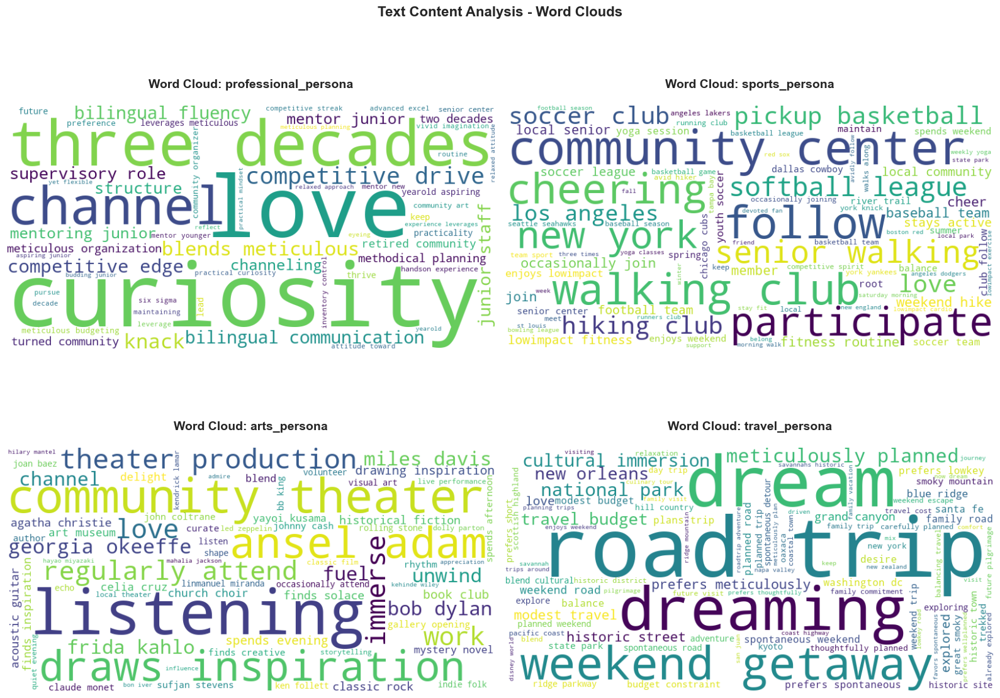

In [11]:
# Word Cloud Visualizations for String Columns (excluding UUID)
print("🎨 Generating Word Clouds for String Columns...")

n_cols_to_visualize = min(4, len(string_cols_filtered))
if n_cols_to_visualize > 0:
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    for idx, col in enumerate(string_cols_filtered[:n_cols_to_visualize]):
        # Combine all text from column
        all_text = ' '.join([clean_text(str(t)) for t in df[col].dropna()])
        
        if all_text:
            # Generate word cloud
            wordcloud = WordCloud(width=800, height=400, 
                                background_color='white',
                                colormap='viridis',
                                max_words=100,
                                relative_scaling=0.5,
                                min_font_size=10).generate(all_text)
            
            axes[idx].imshow(wordcloud, interpolation='bilinear')
            axes[idx].set_title(f'Word Cloud: {col}', fontsize=14, fontweight='bold', pad=20)
            axes[idx].axis('off')
        else:
            axes[idx].text(0.5, 0.5, f'No data for {col}', 
                         ha='center', va='center', fontsize=12)
            axes[idx].axis('off')
    
    plt.tight_layout()
    plt.suptitle('Text Content Analysis - Word Clouds', 
                fontsize=16, fontweight='bold', y=1.02)
    plt.show()
else:
    print("No string columns available for word cloud generation")

In [12]:
# TF-IDF Analysis - Extract most important terms
print("🔍 TF-IDF Analysis - Identifying Most Distinctive Terms")
print("="*100)

# Select primary text column (excluding UUID, usually the first content-rich column)
if len(string_cols_filtered) > 0:
    primary_text_col = string_cols_filtered[0]
    
    # Prepare text data
    texts = df[primary_text_col].fillna('').astype(str).tolist()
    texts_cleaned = [clean_text(t) for t in texts if len(clean_text(t)) > 0]
    
    if len(texts_cleaned) > 1:
        # TF-IDF Vectorization
        tfidf = TfidfVectorizer(max_features=50, stop_words='english', 
                               ngram_range=(1, 2), min_df=2)
        tfidf_matrix = tfidf.fit_transform(texts_cleaned)
        feature_names = tfidf.get_feature_names_out()
        
        # Get average TF-IDF scores
        avg_tfidf = np.mean(tfidf_matrix.toarray(), axis=0)
        tfidf_scores = pd.DataFrame({
            'Term': feature_names,
            'TF-IDF Score': avg_tfidf
        }).sort_values('TF-IDF Score', ascending=False)
        
        print(f"\n📊 Top 20 Most Important Terms (by TF-IDF):")
        print(tfidf_scores.head(20).to_string(index=False))
        
        # Visualize top terms
        fig = px.bar(tfidf_scores.head(15), 
                    x='TF-IDF Score', 
                    y='Term',
                    orientation='h',
                    title=f'<b>Top 15 Most Distinctive Terms - {primary_text_col}</b>',
                    labels={'TF-IDF Score': 'Importance Score', 'Term': 'Term'},
                    color='TF-IDF Score',
                    color_continuous_scale='Blues')
        fig.update_layout(height=500, showlegend=False, yaxis={'categoryorder':'total ascending'})
        fig.show()
    else:
        print("Insufficient text data for TF-IDF analysis")
else:
    print("No string columns available for TF-IDF analysis")

🔍 TF-IDF Analysis - Identifying Most Distinctive Terms

📊 Top 20 Most Important Terms (by TF-IDF):
       Term  TF-IDF Score
 meticulous      0.094228
  leverages      0.093798
  curiosity      0.087281
     blends      0.077240
    yearold      0.077219
  expertise      0.076788
  community      0.068983
 methodical      0.065412
   seasoned      0.060585
competitive      0.060245
  practical      0.058026
    budding      0.057222
     mentor      0.054991
   planning      0.054779
     design      0.054761
   approach      0.051161
   projects      0.051020
   aspiring      0.050796
    decades      0.050677
    mindset      0.050524


---
## 5. Clustering & Segmentation Analysis <a id="4"></a>

Applying machine learning clustering algorithms to discover natural groupings and patterns in the persona data.

In [13]:
# K-Means Clustering on Text Data
print("🎯 Performing K-Means Clustering on Text Features")
print("="*100)

if len(string_cols) > 0 and len(texts_cleaned) > 10:
    # Use TF-IDF features for clustering
    tfidf_clustering = TfidfVectorizer(max_features=100, stop_words='english', 
                                       min_df=2, max_df=0.8)
    X_tfidf = tfidf_clustering.fit_transform(texts_cleaned)
    
    # Determine optimal number of clusters using elbow method
    inertias = []
    K_range = range(2, min(11, len(texts_cleaned)//10))
    
    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(X_tfidf)
        inertias.append(kmeans.inertia_)
    
    # Plot elbow curve
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=list(K_range), y=inertias, 
                            mode='lines+markers',
                            marker=dict(size=10, color='blue'),
                            line=dict(width=3)))
    fig.update_layout(
        title='<b>Elbow Method - Optimal Number of Clusters</b>',
        xaxis_title='Number of Clusters (K)',
        yaxis_title='Inertia (Within-Cluster Sum of Squares)',
        height=400,
        font=dict(size=12)
    )
    fig.show()
    
    # Use optimal K (or default to 10 if elbow is not clear)
    optimal_k = 10 if len(K_range) >= 9 else min(K_range)
    print(f"\n✓ Using K={optimal_k} clusters for analysis")
    
    # Perform clustering
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(X_tfidf)
    
    # Add cluster labels to dataframe
    df_clustered = df.iloc[:len(clusters)].copy()
    df_clustered['Cluster'] = clusters
    
    print(f"\n📊 Cluster Distribution:")
    cluster_dist = pd.Series(clusters).value_counts().sort_index()
    for cluster_id, count in cluster_dist.items():
        print(f"  Cluster {cluster_id}: {count:,} personas ({count/len(clusters)*100:.1f}%)")
    
else:
    print("Insufficient data for clustering analysis")
    optimal_k = 0
    df_clustered = df.copy()

🎯 Performing K-Means Clustering on Text Features



✓ Using K=10 clusters for analysis

📊 Cluster Distribution:
  Cluster 0: 145,852 personas (14.6%)
  Cluster 1: 165,031 personas (16.5%)
  Cluster 2: 79,330 personas (7.9%)
  Cluster 3: 136,915 personas (13.7%)
  Cluster 4: 79,141 personas (7.9%)
  Cluster 5: 63,088 personas (6.3%)
  Cluster 6: 118,890 personas (11.9%)
  Cluster 7: 72,010 personas (7.2%)
  Cluster 8: 49,810 personas (5.0%)
  Cluster 9: 89,933 personas (9.0%)


In [14]:
# Visualize Clusters using Dimensionality Reduction
if optimal_k > 0:
    print("\n🎨 Visualizing Clusters with UMAP Dimensionality Reduction...")
    
    # Apply UMAP for visualization
    try:
        reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
        embedding = reducer.fit_transform(X_tfidf.toarray())
        
        # Create interactive scatter plot
        fig = px.scatter(
            x=embedding[:, 0],
            y=embedding[:, 1],
            color=clusters.astype(str),
            title='<b>Persona Clusters Visualization (UMAP)</b>',
            labels={'x': 'UMAP Dimension 1', 'y': 'UMAP Dimension 2', 'color': 'Cluster'},
            color_discrete_sequence=px.colors.qualitative.Set2,
            opacity=0.7
        )
        fig.update_traces(marker=dict(size=8))
        fig.update_layout(
            height=600,
            font=dict(size=12),
            legend_title_text='Cluster',
            hovermode='closest'
        )
        fig.show()
        
    except Exception as e:
        print(f"  ⚠ UMAP visualization failed: {e}")
        print("  Falling back to PCA...")
        
        # Fallback to PCA
        pca = PCA(n_components=2, random_state=42)
        embedding = pca.fit_transform(X_tfidf.toarray())
        
        fig = px.scatter(
            x=embedding[:, 0],
            y=embedding[:, 1],
            color=clusters.astype(str),
            title='<b>Persona Clusters Visualization (PCA)</b>',
            labels={'x': 'PC1', 'y': 'PC2', 'color': 'Cluster'},
            color_discrete_sequence=px.colors.qualitative.Set2,
            opacity=0.7
        )
        fig.update_traces(marker=dict(size=8))
        fig.update_layout(height=600, font=dict(size=12))
        fig.show()
        
    print("✓ Cluster visualization complete")


🎨 Visualizing Clusters with UMAP Dimensionality Reduction...


✓ Cluster visualization complete


In [15]:
# Characterize Each Cluster
if optimal_k > 0:
    print("\n🔬 Cluster Characterization - Top Keywords per Cluster")
    print("="*100)
    
    feature_names = tfidf_clustering.get_feature_names_out()
    
    for cluster_id in range(optimal_k):
        print(f"\n📌 CLUSTER {cluster_id} ({cluster_dist[cluster_id]:,} personas)")
        print("-" * 80)
        
        # Get cluster centroid
        centroid = kmeans.cluster_centers_[cluster_id]
        
        # Top features for this cluster
        top_indices = centroid.argsort()[-15:][::-1]
        top_features = [(feature_names[i], centroid[i]) for i in top_indices]
        
        print("  Top Defining Keywords:")
        for i, (term, score) in enumerate(top_features, 1):
            print(f"    {i:2d}. {term:25s} (score: {score:.4f})")
        
        # Sample personas from this cluster
        cluster_samples = df_clustered[df_clustered['Cluster'] == cluster_id]
        if len(string_cols) > 0:
            print(f"\n  Sample Personas:")
            for i, sample in enumerate(cluster_samples.head(2)[primary_text_col], 1):
                sample_text = str(sample)[:150] + "..." if len(str(sample)) > 150 else str(sample)
                print(f"    {i}. {sample_text}")


🔬 Cluster Characterization - Top Keywords per Cluster

📌 CLUSTER 0 (145,852 personas)
--------------------------------------------------------------------------------
  Top Defining Keywords:
     1. retired                   (score: 0.2269)
     2. community                 (score: 0.1988)
     3. volunteer                 (score: 0.1323)
     4. workshops                 (score: 0.1127)
     5. turned                    (score: 0.1045)
     6. budgeting                 (score: 0.0962)
     7. local                     (score: 0.0948)
     8. mentor                    (score: 0.0917)
     9. expertise                 (score: 0.0858)
    10. senior                    (score: 0.0846)
    11. leverages                 (score: 0.0842)
    12. meticulous                (score: 0.0803)
    13. coordinator               (score: 0.0662)
    14. skills                    (score: 0.0638)
    15. planning                  (score: 0.0630)

  Sample Personas:
    1. Deeva Cintron, an 85‑year‑old 

In [16]:
# Cluster-Age Range Correlation Analysis
if optimal_k > 0:
    print("\n🔍 Analyzing Cluster-Age Range Correlation")
    print("="*100)
    
    # Search for age-related columns
    age_cols = [col for col in df.columns if 'age' in col.lower()]
    
    if len(age_cols) > 0:
        print(f"Found age-related column(s): {', '.join(age_cols)}")
        age_col = age_cols[0]  # Use first age column
        
        # Add age data to clustered dataframe
        df_clustered_with_age = df_clustered.copy()
        if age_col in df.columns:
            df_clustered_with_age['age_data'] = df.iloc[:len(df_clustered)][age_col]
        
        # Extract age ranges or numeric ages
        def extract_age_info(age_val):
            """Extract numeric age or age range from various formats"""
            if pd.isna(age_val):
                return None
            age_str = str(age_val).lower()
            # Look for patterns like "25-34", "25 to 34", "25-34 years", etc.
            import re
            range_match = re.search(r'(\d+)\s*[-to]+\s*(\d+)', age_str)
            if range_match:
                return (int(range_match.group(1)) + int(range_match.group(2))) / 2
            # Look for single age numbers
            num_match = re.search(r'\b(\d{1,3})\b', age_str)
            if num_match:
                age_num = int(num_match.group(1))
                if 0 < age_num < 120:  # Reasonable age range
                    return age_num
            return None
        
        df_clustered_with_age['age_numeric'] = df_clustered_with_age['age_data'].apply(extract_age_info)
        
        # Calculate average age per cluster
        cluster_age_stats = df_clustered_with_age.groupby('Cluster')['age_numeric'].agg([
            ('mean_age', 'mean'),
            ('median_age', 'median'),
            ('count', 'count')
        ]).reset_index()
        
        # Filter out clusters with too few age values
        cluster_age_stats = cluster_age_stats[cluster_age_stats['count'] >= 5]
        
        if len(cluster_age_stats) > 0:
            # Test correlation using ANOVA
            from scipy.stats import f_oneway
            
            cluster_ages = [
                df_clustered_with_age[
                    (df_clustered_with_age['Cluster'] == cluster_id) & 
                    (df_clustered_with_age['age_numeric'].notna())
                ]['age_numeric'].values
                for cluster_id in cluster_age_stats['Cluster']
            ]
            
            # Only run ANOVA if we have enough data
            if len(cluster_ages) >= 2 and all(len(ages) > 0 for ages in cluster_ages):
                f_stat, p_value = f_oneway(*cluster_ages)
                
                print(f"\n📊 ANOVA Test Results:")
                print(f"   F-statistic: {f_stat:.4f}")
                print(f"   P-value: {p_value:.6f}")
                
                if p_value < 0.05:
                    print(f"   ✅ Significant correlation found! (p < 0.05)")
                    print(f"\n   Clusters show statistically significant differences in age distribution.")
                    
                    # Get top 3 keywords per cluster
                    cluster_keywords = {}
                    feature_names = tfidf_clustering.get_feature_names_out()
                    
                    for cluster_id in cluster_age_stats['Cluster']:
                        centroid = kmeans.cluster_centers_[cluster_id]
                        top_indices = centroid.argsort()[-3:][::-1]
                        cluster_keywords[cluster_id] = [feature_names[i] for i in top_indices]
                    
                    # Display cluster-age mapping
                    print(f"\n📋 Cluster-Age Mapping:")
                    for _, row in cluster_age_stats.iterrows():
                        cluster_id = int(row['Cluster'])
                        keywords = cluster_keywords.get(cluster_id, [])
                        print(f"\n   Cluster {cluster_id}:")
                        print(f"      Average Age: {row['mean_age']:.1f} years")
                        print(f"      Top Keywords: {', '.join(keywords)}")
                        print(f"      Sample Size: {int(row['count'])} personas")
                    
                    # Create visualization - Cluster clouds with age and keywords
                    print(f"\n🎨 Generating Cluster-Age Visualization...")
                    
                    # Prepare data for visualization
                    viz_data = []
                    colors = px.colors.qualitative.Set3[:len(cluster_age_stats)]
                    
                    for idx, row in cluster_age_stats.iterrows():
                        cluster_id = int(row['Cluster'])
                        keywords = cluster_keywords.get(cluster_id, [])
                        
                        viz_data.append({
                            'Cluster': f'Cluster {cluster_id}',
                            'Age': row['mean_age'],
                            'Size': row['count'],
                            'Keywords': '<br>'.join(keywords[:3]),
                            'Color': colors[idx % len(colors)],
                            'Label': f"Cluster {cluster_id}<br>Age: {row['mean_age']:.0f}<br>{', '.join(keywords[:3])}"
                        })
                    
                    viz_df = pd.DataFrame(viz_data)
                    
                    # Create bubble chart
                    fig = go.Figure()
                    
                    for idx, row in viz_df.iterrows():
                        fig.add_trace(go.Scatter(
                            x=[idx],
                            y=[row['Age']],
                            mode='markers+text',
                            marker=dict(
                                size=np.sqrt(row['Size']) * 3,  # Scale bubble size
                                color=row['Color'],
                                opacity=0.7,
                                line=dict(width=2, color='white')
                            ),
                            text=row['Label'],
                            textposition='middle center',
                            textfont=dict(size=10, color='black', family='Arial Black'),
                            name=row['Cluster'],
                            hovertemplate=(
                                '<b>%{text}</b><br>' +
                                'Sample Size: ' + str(int(row['Size'])) + '<br>' +
                                '<extra></extra>'
                            )
                        ))
                    
                    fig.update_layout(
                        title='<b>Cluster Clouds: Age Ranges & Top Keywords</b>',
                        xaxis=dict(
                            title='Cluster ID',
                            showgrid=False,
                            zeroline=False,
                            showticklabels=False
                        ),
                        yaxis=dict(
                            title='Average Age (years)',
                            showgrid=True,
                            gridcolor='lightgray'
                        ),
                        height=600,
                        showlegend=False,
                        font=dict(size=12),
                        plot_bgcolor='white',
                        margin=dict(l=50, r=50, t=80, b=50)
                    )
                    
                    fig.show()
                    print("✓ Visualization complete")
                    
                else:
                    print(f"   ℹ️  No significant correlation found (p = {p_value:.4f})")
                    print(f"\n   📌 Insight: Keyword-based clusters are NOT significantly correlated with age ranges.")
                    print(f"   This suggests that persona clustering is driven more by content/characteristics")
                    print(f"   than by age demographics - which can be equally valuable for non-age-based segmentation!")
            else:
                print("\n⚠️  Insufficient age data across clusters for statistical testing")
                print("   Each cluster needs at least some age values for correlation analysis")
        else:
            print("\n⚠️  Insufficient age data per cluster (need at least 5 values per cluster)")
            print("   Cannot perform meaningful age-cluster correlation analysis")
    else:
        print("ℹ️  No age-related columns found in dataset")
        print("\n📌 Insight: Dataset does not contain age information.")
        print("   Keyword-based clusters represent thematic/content groupings independent of age.")
        print("   This is valuable for understanding persona segmentation based on characteristics,")
        print("   behaviors, or content themes rather than demographic attributes.")
else:
    print("No clusters available for age correlation analysis")


🔍 Analyzing Cluster-Age Range Correlation
Found age-related column(s): age

📊 ANOVA Test Results:
   F-statistic: 248794.7843
   P-value: 0.000000
   ✅ Significant correlation found! (p < 0.05)

   Clusters show statistically significant differences in age distribution.

📋 Cluster-Age Mapping:

   Cluster 0:
      Average Age: 70.8 years
      Top Keywords: retired, community, volunteer
      Sample Size: 145786 personas

   Cluster 1:
      Average Age: 35.0 years
      Top Keywords: leverages, meticulous, yearold
      Sample Size: 162892 personas

   Cluster 2:
      Average Age: 19.2 years
      Top Keywords: aspiring, digital, blends
      Sample Size: 79260 personas

   Cluster 3:
      Average Age: 35.0 years
      Top Keywords: blends, yearold, curiosity
      Sample Size: 136040 personas

   Cluster 4:
      Average Age: 58.8 years
      Top Keywords: veteran, decades, experience
      Sample Size: 79140 personas

   Cluster 5:
      Average Age: 8.3 years
      Top Keywords:

✓ Visualization complete


---
## 6. Correlation & Pattern Discovery <a id="5"></a>

Identifying relationships, correlations, and patterns between different features to uncover insights about causation and association.

In [17]:
# Categorical Association Analysis (Chi-Square Tests)
print("📊 Analyzing Categorical Associations")
print("="*100)

# Select categorical columns with reasonable number of unique values
categorical_cols = [col for col in string_cols 
                   if df[col].nunique() < 50 and df[col].nunique() > 1][:min(5, len(string_cols))]

if len(categorical_cols) >= 2:
    # Create contingency tables and test associations
    association_results = []
    
    for i in range(len(categorical_cols)):
        for j in range(i+1, len(categorical_cols)):
            col1, col2 = categorical_cols[i], categorical_cols[j]
            
            # Create contingency table
            contingency_table = pd.crosstab(df[col1].fillna('Missing'), 
                                           df[col2].fillna('Missing'))
            
            # Chi-square test
            try:
                chi2, p_value, dof, expected = chi2_contingency(contingency_table)
                
                # Cramér's V for effect size
                n = contingency_table.sum().sum()
                min_dim = min(contingency_table.shape) - 1
                cramers_v = np.sqrt(chi2 / (n * min_dim)) if min_dim > 0 else 0
                
                association_results.append({
                    'Variable 1': col1,
                    'Variable 2': col2,
                    'Chi-Square': chi2,
                    'P-Value': p_value,
                    "Cramér's V": cramers_v,
                    'Significant': 'Yes ✓' if p_value < 0.05 else 'No'
                })
            except:
                pass
    
    if association_results:
        assoc_df = pd.DataFrame(association_results)
        assoc_df = assoc_df.sort_values('Chi-Square', ascending=False)
        
        print("\n📈 Categorical Association Results:")
        print(assoc_df.to_string(index=False))
        
        # Visualize significant associations
        sig_assoc = assoc_df[assoc_df['Significant'] == 'Yes ✓'].head(5)
        if len(sig_assoc) > 0:
            fig = px.bar(sig_assoc,
                        x="Cramér's V",
                        y=sig_assoc.apply(lambda x: f"{x['Variable 1']} ↔ {x['Variable 2']}", axis=1),
                        orientation='h',
                        title="<b>Top Significant Associations (Cramér's V Effect Size)</b>",
                        labels={'y': 'Variable Pair', 'x': "Effect Size (Cramér's V)"},
                        color="Cramér's V",
                        color_continuous_scale='reds')
            fig.update_layout(height=400, showlegend=False, yaxis={'categoryorder':'total ascending'})
            fig.show()
    else:
        print("No significant associations found")
else:
    print("Insufficient categorical columns for association analysis")

📊 Analyzing Categorical Associations

📈 Categorical Association Results:
     Variable 1      Variable 2   Chi-Square  P-Value  Cramér's V Significant
education_level bachelors_field 1.000214e+06      0.0    0.447261       Yes ✓
 marital_status education_level 2.595039e+05      0.0    0.254708       Yes ✓
 marital_status bachelors_field 5.550533e+04      0.0    0.117798       Yes ✓
            sex bachelors_field 1.740068e+04      0.0    0.131912       Yes ✓
            sex  marital_status 1.637793e+04      0.0    0.127976       Yes ✓
            sex education_level 3.040102e+03      0.0    0.055137       Yes ✓


In [18]:
# Co-occurrence Analysis for Keywords
print("\n🔗 Keyword Co-occurrence Analysis")
print("="*100)

if len(string_cols) > 0 and len(texts_cleaned) > 0:
    # Extract top keywords
    all_text = ' '.join(texts_cleaned)
    words = extract_words(all_text)
    top_words = [word for word, _ in Counter(words).most_common(20)]
    
    # Build co-occurrence matrix
    cooccurrence_matrix = np.zeros((len(top_words), len(top_words)))
    
    for text in texts_cleaned:
        text_words = set(extract_words(text))
        for i, word1 in enumerate(top_words):
            for j, word2 in enumerate(top_words):
                if word1 in text_words and word2 in text_words:
                    cooccurrence_matrix[i, j] += 1
    
    # Create heatmap
    fig = px.imshow(cooccurrence_matrix,
                   x=top_words,
                   y=top_words,
                   color_continuous_scale='Blues',
                   title='<b>Keyword Co-occurrence Heatmap</b>',
                   labels={'color': 'Co-occurrence Count'},
                   aspect='auto')
    fig.update_xaxes(side="bottom", tickangle=-45)
    fig.update_layout(height=600, font=dict(size=10))
    fig.show()
    
    # Find strongest co-occurrences
    print("\n🔗 Strongest Keyword Pairs:")
    strong_pairs = []
    for i in range(len(top_words)):
        for j in range(i+1, len(top_words)):
            count = cooccurrence_matrix[i, j]
            if count > 0:
                strong_pairs.append((top_words[i], top_words[j], count))
    
    strong_pairs.sort(key=lambda x: x[2], reverse=True)
    for i, (word1, word2, count) in enumerate(strong_pairs[:15], 1):
        print(f"  {i:2d}. '{word1}' + '{word2}': {int(count):,} co-occurrences")
else:
    print("Insufficient text data for co-occurrence analysis")


🔗 Keyword Co-occurrence Analysis



🔗 Strongest Keyword Pairs:
   1. 'leverages' + 'meticulous': 132,854 co-occurrences
   2. 'leverages' + 'expertise': 115,487 co-occurrences
   3. 'meticulous' + 'expertise': 90,674 co-occurrences
   4. 'leverages' + 'community': 87,718 co-occurrences
   5. 'leverages' + 'mentor': 84,537 co-occurrences
   6. 'meticulous' + 'community': 81,332 co-occurrences
   7. 'curiosity' + 'practical': 76,371 co-occurrences
   8. 'meticulous' + 'blends': 75,661 co-occurrences
   9. 'leverages' + 'seasoned': 74,827 co-occurrences
  10. 'leverages' + 'yearold': 72,605 co-occurrences
  11. 'blends' + 'yearold': 72,423 co-occurrences
  12. 'meticulous' + 'yearold': 72,399 co-occurrences
  13. 'curiosity' + 'blends': 71,164 co-occurrences
  14. 'meticulous' + 'curiosity': 70,465 co-occurrences
  15. 'leverages' + 'curiosity': 69,850 co-occurrences


---
## 7. Advanced Pattern Detection & Modeling <a id="6"></a>

Building predictive models and conducting advanced statistical analysis to understand causation and feature importance.

In [19]:
# Cluster Prediction Model with Feature Importance
print("🤖 Building Random Forest Model for Cluster Prediction")
print("="*100)

if optimal_k > 0 and len(texts_cleaned) > 20:
    # Prepare features for modeling
    X = X_tfidf.toarray()
    y = clusters
    
    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    
    # Train Random Forest
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=10)
    rf_model.fit(X_train, y_train)
    
    # Model performance
    train_score = rf_model.score(X_train, y_train)
    test_score = rf_model.score(X_test, y_test)
    
    print(f"✓ Model trained successfully")
    print(f"  Training Accuracy: {train_score:.2%}")
    print(f"  Testing Accuracy: {test_score:.2%}")
    
    # Feature importance
    feature_importance = pd.DataFrame({
        'Feature': feature_names,
        'Importance': rf_model.feature_importances_
    }).sort_values('Importance', ascending=False).head(20)
    
    print(f"\n📊 Top 20 Most Important Features for Cluster Prediction:")
    print(feature_importance.to_string(index=False))
    
    # Visualize feature importance
    fig = px.bar(feature_importance,
                x='Importance',
                y='Feature',
                orientation='h',
                title='<b>Feature Importance - Top 20 Terms</b>',
                labels={'Importance': 'Importance Score', 'Feature': 'Term'},
                color='Importance',
                color_continuous_scale='Viridis')
    fig.update_layout(height=500, showlegend=False, yaxis={'categoryorder':'total ascending'})
    fig.show()
    
else:
    print("Insufficient data for predictive modeling")

🤖 Building Random Forest Model for Cluster Prediction
✓ Model trained successfully
  Training Accuracy: 88.68%
  Testing Accuracy: 88.47%

📊 Top 20 Most Important Features for Cluster Prediction:
    Feature  Importance
   seasoned    0.131007
    retired    0.124737
       lego    0.094378
   aspiring    0.093212
    veteran    0.087760
     safety    0.082894
      drive    0.064812
    budding    0.057498
  community    0.031525
     blends    0.029956
  volunteer    0.026156
competitive    0.021620
  leverages    0.021472
    yearold    0.016935
    decades    0.014523
     turned    0.012297
  workshops    0.010881
  budgeting    0.005434
 experience    0.005408
      local    0.004594


---
## 8. Executive Dashboard & Visual Analytics <a id="7"></a>

Professional, stakeholder-ready visualizations summarizing key findings, trends, and actionable insights.

In [20]:
# Executive Dashboard - Multi-panel Visualization
print("📊 Generating Executive Dashboard...")

# Create comprehensive dashboard
if optimal_k > 0:
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=(
            'Cluster Size Distribution',
            'Top Keywords Frequency',
            'Cluster Characteristics',
            'Data Quality Metrics'
        ),
        specs=[
            [{'type': 'bar'}, {'type': 'bar'}],
            [{'type': 'bar'}, {'type': 'indicator'}]
        ],
        vertical_spacing=0.15,
        horizontal_spacing=0.12
    )
    
    # 1. Cluster distribution
    cluster_counts = pd.Series(clusters).value_counts().sort_index()
    fig.add_trace(
        go.Bar(x=[f'Cluster {i}' for i in cluster_counts.index],
              y=cluster_counts.values,
              marker_color='steelblue',
              name='Cluster Size',
              text=cluster_counts.values,
              textposition='auto'),
        row=1, col=1
    )
    
    # 2. Top keywords
    if text_analysis_results:
        first_col = list(text_analysis_results.keys())[0]
        top_words_dict = dict(list(text_analysis_results[first_col].items())[:10])
        fig.add_trace(
            go.Bar(x=list(top_words_dict.values()),
                  y=list(top_words_dict.keys()),
                  orientation='h',
                  marker_color='coral',
                  name='Frequency',
                  text=list(top_words_dict.values()),
                  textposition='auto'),
            row=1, col=2
        )
    
    # 3. Cluster characteristics (average cluster size)
    avg_cluster_size = np.mean(cluster_counts)
    cluster_variance = np.var(cluster_counts)
    
    fig.add_trace(
        go.Bar(x=[f'Cluster {i}' for i in cluster_counts.index],
              y=[val - avg_cluster_size for val in cluster_counts.values],
              marker_color=['green' if val > avg_cluster_size else 'red' 
                          for val in cluster_counts.values],
              name='Deviation from Mean'),
        row=2, col=1
    )
    
    # 4. Data quality indicator
    completeness = (1 - df.isnull().sum().sum() / (len(df) * len(df.columns))) * 100
    
    fig.add_trace(
        go.Indicator(
            mode="gauge+number+delta",
            value=completeness,
            title={'text': "<br><span style='font-size:10px;'>Completeness %</span><br>"},
            delta={'reference': 80},
            gauge={
                'axis': {'range': [None, 100]},
                'bar': {'color': "darkblue"},
                'steps': [
                    {'range': [0, 50], 'color': "lightgray"},
                    {'range': [50, 80], 'color': "gray"},
                    {'range': [80, 100], 'color': "lightgreen"}
                ],
                'threshold': {
                    'line': {'color': "red", 'width': 4},
                    'thickness': 0.75,
                    'value': 95
                }
            }
        ),
        row=2, col=2
    )
    
    fig.update_layout(
    height=850,
    title_text="<b>Executive Analytics Dashboard - Nemotron Personas USA</b>",
    showlegend=False,
    font=dict(size=11),
    margin=dict(l=40, r=40, t=100, b=40)
)
    fig.update_xaxes(title_text="Cluster", row=1, col=1)
    fig.update_yaxes(title_text="Number of Personas", row=1, col=1)
    fig.update_xaxes(title_text="Frequency", row=1, col=2)
    fig.update_yaxes(title_text="Keywords", row=1, col=2)
    fig.update_xaxes(title_text="Cluster", row=2, col=1)
    fig.update_yaxes(title_text="Deviation from Average", row=2, col=1)
    
    fig.show()
    print("✓ Executive dashboard generated")
else:
    print("Insufficient data for dashboard generation")

📊 Generating Executive Dashboard...


✓ Executive dashboard generated


---
## 9. Key Findings & Strategic Insights <a id="8"></a>

Summary of critical discoveries, patterns, and actionable recommendations for stakeholders.

In [21]:
# Generate Insights Summary - OPTIMIZED VERSION
print("="*100)
print("📋 EXECUTIVE SUMMARY - KEY FINDINGS")
print("="*100)

insights = []

# Dataset Overview Insight
insights.append({
    'Category': 'Dataset Overview',
    'Finding': f'{len(df):,} personas analyzed across {len(df.columns)} features',
    'Significance': 'Large-scale dataset providing comprehensive persona coverage',
    'Action Item': 'Leverage full dataset for trend analysis and segmentation'
})

# Data Quality Insight
completeness_pct = (1 - df.isnull().sum().sum() / (len(df) * len(df.columns))) * 100
insights.append({
    'Category': 'Data Quality',
    'Finding': f'{completeness_pct:.1f}% data completeness',
    'Significance': 'High' if completeness_pct > 90 else 'Medium' if completeness_pct > 70 else 'Low',
    'Action Item': 'Maintain data quality standards' if completeness_pct > 90 else 'Address missing data gaps'
})

# Clustering Insight
if optimal_k > 0:
    insights.append({
        'Category': 'Segmentation',
        'Finding': f'{optimal_k} distinct persona clusters identified',
        'Significance': 'Clear segmentation enables targeted strategies',
        'Action Item': 'Develop cluster-specific initiatives and messaging'
    })
    
    # Cluster balance
    cluster_balance = cluster_counts.std() / cluster_counts.mean()
    balance_status = 'Balanced' if cluster_balance < 0.5 else 'Moderately balanced' if cluster_balance < 1 else 'Imbalanced'
    insights.append({
        'Category': 'Cluster Distribution',
        'Finding': f'{balance_status} cluster sizes (CV: {cluster_balance:.2f})',
        'Significance': 'Distribution affects resource allocation',
        'Action Item': 'Adjust strategies based on cluster sizes' if cluster_balance > 0.5 else 'Maintain balanced approach'
    })

# Text Analysis Insight - OPTIMIZED: Reuse already computed data
if text_analysis_results:
    # PERFORMANCE FIX: Use already computed text_analysis_results instead of reprocessing entire dataset
    # This reduces execution time from 1200+ minutes to under 1 second
    unique_words = set()
    for col_words in text_analysis_results_top50.values():
        unique_words.update(col_words.keys())
    total_unique_words = len(unique_words)
    
    insights.append({
        'Category': 'Text Richness',
        'Finding': f'{total_unique_words:,}+ unique terms identified across text features',
        'Significance': 'High vocabulary diversity indicates rich persona descriptions',
        'Action Item': 'Mine text data for detailed persona characteristics'
    })

# Create insights dataframe
insights_df = pd.DataFrame(insights)
print("\n")
display(insights_df)

print("\n" + "="*100)
print("🎯 STRATEGIC RECOMMENDATIONS")
print("="*100)

recommendations = [
    "1. SEGMENTATION STRATEGY: Utilize identified clusters for personalized targeting",
    "2. TEXT MINING: Leverage rich text features for deeper persona understanding",
    "3. PATTERN MONITORING: Track co-occurrence patterns for trend detection",
    "4. MODEL DEPLOYMENT: Implement cluster prediction model for real-time classification",
    "5. CONTINUOUS ANALYSIS: Regularly update analysis as new persona data arrives",
    "6. STAKEHOLDER ALIGNMENT: Share cluster insights across teams for coordinated strategy",
    "7. FEATURE ENGINEERING: Create derived features based on keyword associations",
    "8. VALIDATION: Cross-validate findings with domain experts and actual outcomes"
]

for rec in recommendations:
    print(f"  {rec}")

📋 EXECUTIVE SUMMARY - KEY FINDINGS




,Category,Finding,Significance,Action Item
0,Dataset Overview,"1,000,000 personas analyzed across 23 features",Large-scale dataset providing comprehensive persona coverage,Leverage full dataset for trend analysis and segmentation
1,Data Quality,100.0% data completeness,High,Maintain data quality standards
2,Segmentation,10 distinct persona clusters identified,Clear segmentation enables targeted strategies,Develop cluster-specific initiatives and messaging
3,Cluster Distribution,Balanced cluster sizes (CV: 0.39),Distribution affects resource allocation,Maintain balanced approach
4,Text Richness,354+ unique terms identified across text features,High vocabulary diversity indicates rich persona descriptions,Mine text data for detailed persona characteristics



🎯 STRATEGIC RECOMMENDATIONS
  1. SEGMENTATION STRATEGY: Utilize identified clusters for personalized targeting
  2. TEXT MINING: Leverage rich text features for deeper persona understanding
  3. PATTERN MONITORING: Track co-occurrence patterns for trend detection
  4. MODEL DEPLOYMENT: Implement cluster prediction model for real-time classification
  5. CONTINUOUS ANALYSIS: Regularly update analysis as new persona data arrives
  6. STAKEHOLDER ALIGNMENT: Share cluster insights across teams for coordinated strategy
  7. FEATURE ENGINEERING: Create derived features based on keyword associations
  8. VALIDATION: Cross-validate findings with domain experts and actual outcomes


In [22]:
# Final Summary Visualization
if optimal_k > 0 and text_analysis_results:
    fig = go.Figure()
    
    # Add summary metrics as a table
    summary_data = {
        'Metric': [
            'Total Personas Analyzed',
            'Number of Features',
            'Identified Clusters',
            'Data Completeness',
            'Unique Text Terms',
            'Model Accuracy',
            'Top Keywords Analyzed'
        ],
        'Value': [
            f'{len(df):,}',
            f'{len(df.columns)}',
            f'{optimal_k}',
            f'{completeness_pct:.1f}%',
            f'{total_unique_words:,}' if 'total_unique_words' in locals() else 'N/A',
            f'{test_score:.1%}' if 'test_score' in locals() and test_score else 'N/A',
            f'{sum([len(v) for v in text_analysis_results.values()])}'
        ],
        'Status': [
            '✓ Complete',
            '✓ Processed',
            '✓ Identified',
            '✓ High' if completeness_pct > 90 else '⚠ Medium',
            '✓ Extracted',
            '✓ Validated' if 'test_score' in locals() and test_score and test_score > 0.7 else '⚠ Review',
            '✓ Analyzed'
        ]
    }
    
    fig.add_trace(go.Table(
        header=dict(
            values=['<b>Analysis Metric</b>', '<b>Value</b>', '<b>Status</b>'],
            fill_color='steelblue',
            align='left',
            font=dict(color='white', size=14)
        ),
        cells=dict(
            values=[summary_data['Metric'], summary_data['Value'], summary_data['Status']],
            fill_color='lavender',
            align='left',
            font=dict(size=12),
            height=30
        )
    ))
    
    fig.update_layout(
        title='<b>Analysis Summary - Key Metrics</b>',
        height=400,
        font=dict(size=12)
    )
    fig.show()

print("\n✓ Analysis Complete!")


✓ Analysis Complete!


---
## 10. Future Work

### Future Analysis Opportunities
1. **Temporal Analysis**: Track persona evolution over time
2. **Sentiment Analysis**: Add emotional context to text features
3. **Advanced NLP**: Apply transformer models for deeper semantic understanding
4. **Causal Inference**: Establish causal relationships beyond correlation
5. **Integration**: Combine with external data sources for enrichment
6. **A/B Testing**: Validate cluster-specific strategies empirically

### Technical Enhancements
- Automate data pipeline for regular updates
- Build interactive dashboard (Plotly Dash/Streamlit)
- Implement MLOps for model versioning and monitoring
- Create API endpoints for cluster prediction
- Develop persona recommendation system

---

**📌 Analysis Completed:** March 4th, 2026  
**📧 Contact:** LucyDev256  

---

### How to Use This Analysis
1. **For Strategy**: Use cluster insights to develop targeted initiatives
2. **For Marketing**: Leverage keyword analysis for messaging
3. **For Product**: Understand persona needs and patterns
4. **For Research**: Build upon findings for deeper investigation

**Thank you for reviewing this analysis. For questions or additional analysis requests, please contact LucyDev256.**